In [1]:
import numpy as np
import pyodbc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from pandas.api.types import CategoricalDtype
sns.set(style="ticks", color_codes=True)

In [2]:
conn = pyodbc.connect("Driver={SQL Server Native Client 11.0};"
                      "Server=DESKTOP-79V6INH\DANIEL1;"
                      "Database=clalit;"
                      "Trusted_Connection=yes;")

In [3]:
cursor = conn.cursor()
cursor.execute('SELECT * FROM dbo.clalit3')
full_data=cursor



In [5]:
df = pd.read_sql( 'SELECT * FROM dbo.clalit3',conn)

In [41]:
df.head()

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Prediction,Sourcing_source,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock
0,3224.0,10000005719,03/2017,11,ZHW1,20140,1.0,None,None,0.0,...,7351.0,ארץ,0.0,ave,no,LOW,408668,None,7350.0,4671.0
1,3224.0,10000006427,02/2019,120,ZHW1,20190,1.0,None,None,0.0,...,25312.0,ארץ,0.0,ave,no,LOW,400095,3999005422,7350.0,31010.0
2,3315.0,10000001880,07/2017,2,ZHW1,20270,1.0,0,0,0.0,...,1231.0,ארץ,0.0,ave,no,HIGH,124207,None,7350.0,924.0
3,3315.0,10000007355,11/2018,5,ZHW3,10200,1.0,None,None,0.0,...,0.0,ארץ,0.0,ave,no,HIGH,400044,None,7350.0,0.0
4,3224.0,10000006732,02/2017,30,ZHW1,20180,1.0,None,None,0.0,...,45373.0,ארץ,0.0,ave,no,LOW,400077,3999010655,7350.0,53858.0


In [7]:
df.columns = [c.replace(' ', '_') for c in df.columns]

In [8]:
df.shape

(109200, 59)

In [9]:
df.describe()

,storecode,TranQuantity,status,Item_Type,General_purpose,Pure_OTC,Toxic_item,Narcotic_/_psychotropic,chronic,Chemical_/_biological,...,Price_for_absolute_packaging,Inventory,consumption,Inventory_of_consumption_months,Current_consumption,consumption_previous_year,Prediction,Exceptional_policy,Plant,Safety_Stock
count,109200.000000,109200.000000,109200.0,108717.000000,109200.000000,109200.000000,100316.000000,59220.000000,108640.000000,100010.000000,...,109195.000000,1.092000e+05,1.092000e+05,109200.000000,1.092000e+05,1.092000e+05,1.092000e+05,109200.000000,109200.0,1.092000e+05
mean,3268.803333,196.184725,1.0,0.008913,0.066282,0.260751,0.006450,0.101857,0.431222,1.036056,...,310.562706,1.038128e+05,7.789594e+04,1.764411,1.037282e+05,8.850701e+05,7.487273e+04,0.106456,7350.0,7.224411e+04
std,45.494875,589.865950,0.0,0.182284,0.590389,0.439046,0.104755,0.459648,0.495249,0.186431,...,1367.937260,3.616717e+05,2.449828e+05,7.255484,3.217490e+05,2.696713e+06,2.328043e+05,0.308422,0.0,2.876769e+05
min,3224.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,7350.0,0.000000e+00
25%,3224.000000,3.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,7.600000,1.261000e+03,8.360000e+02,0.750000,9.820000e+02,1.117200e+04,7.540000e+02,0.000000,7350.0,6.970000e+02
50%,3224.000000,20.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,16.380000,5.710000e+03,4.720000e+03,1.360000,5.879000e+03,6.133200e+04,4.390000e+03,0.000000,7350.0,3.116000e+03
75%,3315.000000,126.000000,1.0,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,71.400000,6.575000e+04,4.737750e+04,2.190000,6.279000e+04,5.831100e+05,4.601600e+04,0.000000,7350.0,4.088300e+04
max,3315.000000,12780.000000,1.0,6.000000,6.000000,1.000000,3.000000,5.000000,1.000000,2.000000,...,49409.360000,6.462780e+06,4.392300e+06,786.670000,5.666490e+06,4.604487e+07,4.302782e+06,1.000000,7350.0,5.242283e+06


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109200 entries, 0 to 109199
Data columns (total 59 columns):
storecode                                      109200 non-null float64
skucode2                                       109200 non-null object
month_year                                     109200 non-null object
TranQuantity                                   109200 non-null float64
Material_Type                                  109200 non-null object
A_group_of_materials                           109200 non-null object
status                                         109200 non-null float64
dangerous_substance                            13011 non-null object
Dangerous_material_is_charged_with_a_permit    13010 non-null object
Item_Type                                      108717 non-null float64
General_purpose                                109200 non-null float64
Affiliation_Group                              109013 non-null object
Pure_OTC                                      

In [10]:
print(df.isnull().sum())

storecode                                           0
skucode2                                            0
month_year                                          0
TranQuantity                                        0
Material_Type                                       0
A_group_of_materials                                0
status                                              0
dangerous_substance                             96189
Dangerous_material_is_charged_with_a_permit     96190
Item_Type                                         483
General_purpose                                     0
Affiliation_Group                                 187
Pure_OTC                                            0
Budget_Group                                        0
Toxic_item                                       8884
Form_of_giving                                  64017
Narcotic_/_psychotropic                         49980
chronic                                           560
Main_outline                

In [13]:
# Looking at missing values percentage for each column

(df.isnull().sum()/df.shape[0] * 100).sort_values(axis=0, ascending=False, inplace=False, kind='quicksort')

European_patent_expires                        98.576007
U#S#_Patent_Expires                            98.287546
For_adults                                     95.745421
Validity_of_Ministry_of_Health_registration    95.043040
type_of_packeging                              94.054945
Dangerous_material_is_charged_with_a_permit    88.086081
dangerous_substance                            88.085165
GENERY_FATHER                                  59.382784
Form_of_giving                                 58.623626
Narcotic_/_psychotropic                        45.769231
Date_of_basket_entry                           45.700549
Serving_form                                    8.728022
Chemical_/_biological                           8.415751
Toxic_item                                      8.135531
Description_outline                             7.620879
Main_outline                                    7.620879
Alternative_purchasing_group                    3.929487
Description_Alternative_purchas

In [11]:
duplicate_rows=df.duplicated()
df[duplicate_rows]

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Prediction,Sourcing_source,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock


In [12]:
from pandas_profiling import ProfileReport
prof = ProfileReport(df)
prof.to_file(output_file='output.html')
prof.to_notebook_iframe()

from importlib import reload
!pip install pyMechkar --upgrade

from pyMechkar.analysis import Table1
tab1 = Table1(data=df, y='TranQuantity')
tab1

In [61]:
col_names = list(df)
col_names

['storecode',
 'skucode2',
 'month_year',
 'TranQuantity',
 'Material_Type',
 'A_group_of_materials',
 'status',
 'dangerous_substance',
 'Dangerous_material_is_charged_with_a_permit',
 'Item_Type',
 'General_purpose',
 'Affiliation_Group',
 'Pure_OTC',
 'Budget_Group',
 'Toxic_item',
 'Form_of_giving',
 'Narcotic_/_psychotropic',
 'chronic',
 'Main_outline',
 'Description_outline',
 'Validity_of_Ministry_of_Health_registration',
 'Alternative_purchasing_group',
 'Description_Alternative_purchasing_group',
 'Chemical_/_biological',
 'European_patent_expires',
 'U#S#_Patent_Expires',
 'Send_code_to_Omri',
 'Item_in_health_basket',
 'Date_of_basket_entry',
 'Must_prescribe',
 'For_adults',
 'Serving_form',
 'type_of_packeging',
 'Quantity_in_Packaging-Absolute',
 'Quantity_in_packing-relative',
 'Establishment_date_of_the_item',
 'ATC',
 'Basic_unit_of_measure',
 'ABC',
 'volume',
 'Quantity_in_absolute_packaging',
 'PRICE',
 'Price_for_absolute_packaging',
 'Loading_group',
 'Inventory'

In [62]:
col_names = ['storecode',
 'skucode2',
 'Material_Type',
 'A_group_of_materials',
 'status',
 'dangerous_substance',
 'Dangerous_material_is_charged_with_a_permit',
 'Item_Type',
 'General_purpose',
 'Affiliation_Group',
 'Pure_OTC',
 'Budget_Group',
 'Toxic_item',
 'Form_of_giving',
 'Narcotic_/_psychotropic',
 'chronic',
 'Main_outline',
 'Description_outline',
 'Validity_of_Ministry_of_Health_registration',
 'Alternative_purchasing_group',
 'Description_Alternative_purchasing_group',
 'Chemical_/_biological',
 'Send_code_to_Omri',
 'Item_in_health_basket',
 'Must_prescribe',
 'For_adults',
 'Serving_form',
 'type_of_packeging',
 'ATC',
 'Basic_unit_of_measure',
 'ABC',
 'Loading_group',
 'Sourcing_source',
 'Exceptional_policy',
 'Consumer_management',
 'Seasonality',
 'VENDOR',
 'GENERY_FATHER',
 'Plant',]
col_names

['storecode',
 'skucode2',
 'Material_Type',
 'A_group_of_materials',
 'status',
 'dangerous_substance',
 'Dangerous_material_is_charged_with_a_permit',
 'Item_Type',
 'General_purpose',
 'Affiliation_Group',
 'Pure_OTC',
 'Budget_Group',
 'Toxic_item',
 'Form_of_giving',
 'Narcotic_/_psychotropic',
 'chronic',
 'Main_outline',
 'Description_outline',
 'Validity_of_Ministry_of_Health_registration',
 'Alternative_purchasing_group',
 'Description_Alternative_purchasing_group',
 'Chemical_/_biological',
 'Send_code_to_Omri',
 'Item_in_health_basket',
 'Must_prescribe',
 'For_adults',
 'Serving_form',
 'type_of_packeging',
 'ATC',
 'Basic_unit_of_measure',
 'ABC',
 'Loading_group',
 'Sourcing_source',
 'Exceptional_policy',
 'Consumer_management',
 'Seasonality',
 'VENDOR',
 'GENERY_FATHER',
 'Plant']

In [63]:
for col in col_names:
    df[col] = df[col].astype('category',copy=False)


In [64]:
col_names1 = ['month_year','U#S#_Patent_Expires','Date_of_basket_entry']
print("\nNames of dataframe columns")
col_names1


Names of dataframe columns


['month_year', 'U#S#_Patent_Expires', 'Date_of_basket_entry']

In [65]:
for col in col_names1:
    df[col] = df[col].astype('datetime64',copy=False)

In [22]:
df.dtypes

storecode                                             float64
skucode2                                               object
month_year                                             object
TranQuantity                                            int32
Material_Type                                          object
A_group_of_materials                                   object
status                                                float64
dangerous_substance                                    object
Dangerous_material_is_charged_with_a_permit            object
Item_Type                                             float64
General_purpose                                       float64
Affiliation_Group                                      object
Pure_OTC                                              float64
Budget_Group                                           object
Toxic_item                                            float64
Form_of_giving                                         object
Narcotic

!pip install pandas

In [ ]:
##Numeric vs Numeric: scatter plot

In [77]:
df1 = df.select_dtypes([np.float])
df1.head()

,TranQuantity,Quantity_in_Packaging-Absolute,Quantity_in_packing-relative,volume,Quantity_in_absolute_packaging,PRICE,Price_for_absolute_packaging,Inventory,consumption,Inventory_of_consumption_months,Current_consumption,consumption_previous_year,Prediction,Safety_Stock
0,11.0,21.0,0.0,101.000,21.0,9.36,196.56,8811.0,6369.0,1.38,8491.0,83062.0,7351.0,4671.0
1,120.0,30.0,0.0,3.733,30.0,0.21,6.30,68550.0,26450.0,2.59,34920.0,306420.0,25312.0,31010.0
2,2.0,1.0,500.0,941.000,1.0,14.04,14.04,875.0,1321.0,0.66,2220.0,13544.0,1231.0,924.0
3,5.0,1.0,0.0,198.360,1.0,18.81,18.81,0.0,0.0,0.00,0.0,0.0,0.0,0.0
4,30.0,10.0,0.0,10.500,10.0,0.56,5.60,87390.0,47073.0,1.86,59330.0,525410.0,45373.0,53858.0


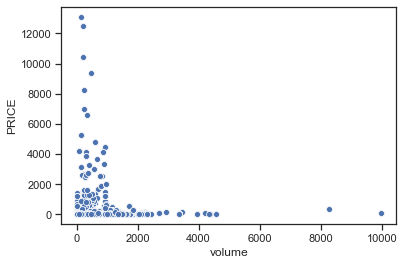

In [97]:
sns.scatterplot(x='volume',y='PRICE',data=df) 

In [23]:
df['TranQuantity'] = df['TranQuantity'].astype(int)

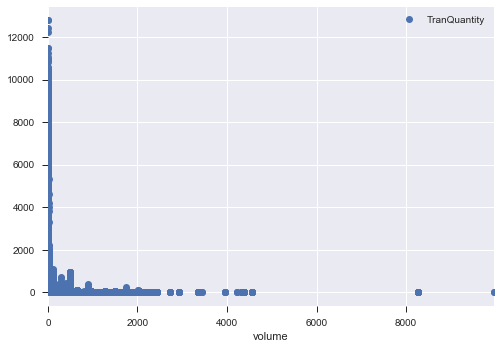

In [40]:
df.plot(x='volume', y='TranQuantity', style='o')

C:\Users\DANIEL\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\DANIEL\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


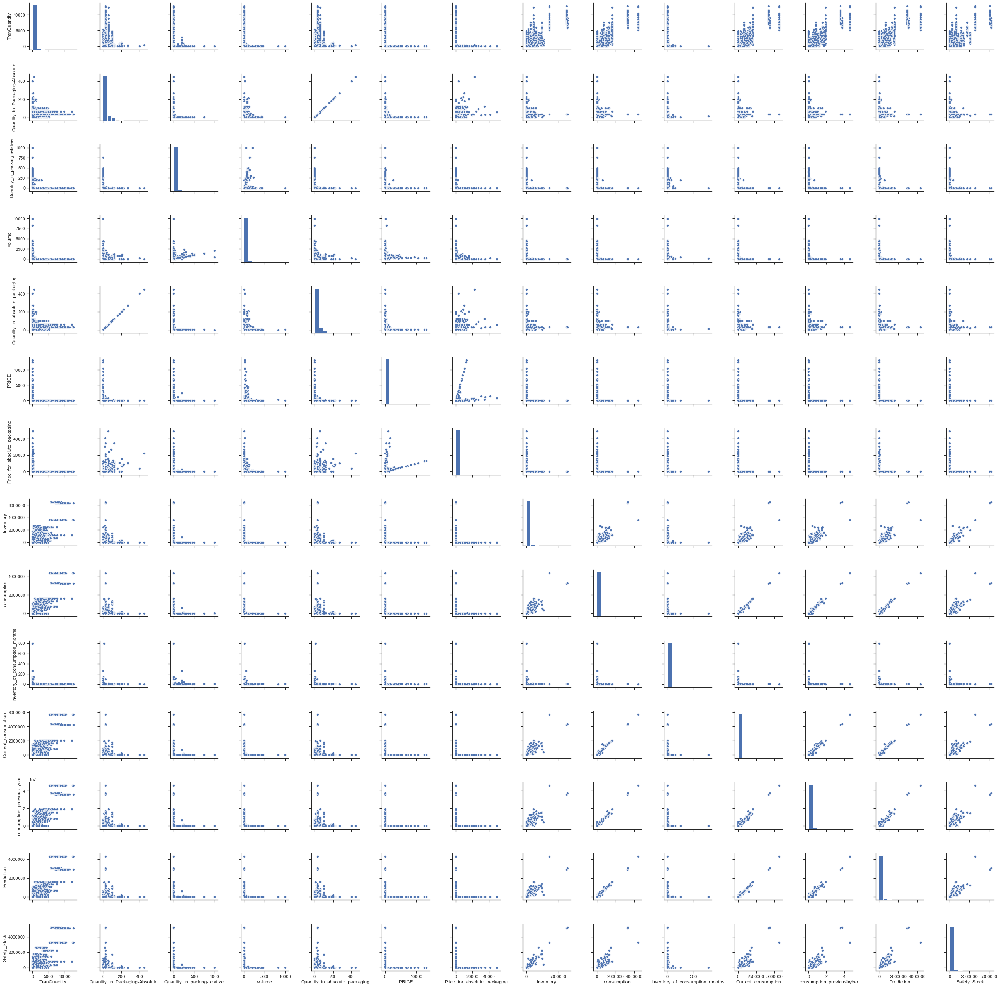

In [83]:
sns.pairplot(df1, height=2.5);

count    109200.000000
mean        196.184725
std         589.865950
min           0.000000
25%           3.000000
50%          20.000000
75%         126.000000
max       12780.000000
Name: TranQuantity, dtype: float64


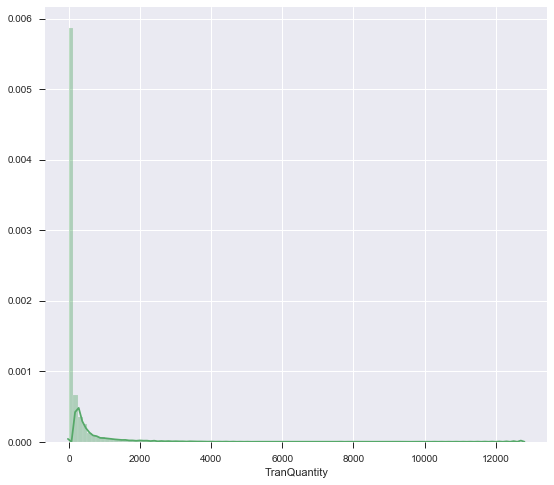

In [24]:
print(df['TranQuantity'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(df['TranQuantity'], color='g', bins=100, hist_kws={'alpha': 0.4});

In [25]:
list(set(df.dtypes.tolist()))

[dtype('O'), dtype('<M8[ns]'), dtype('float64')]

In [27]:
df_num = df.select_dtypes(include = ['float64'])
df_num.head()

,storecode,TranQuantity,status,Item_Type,General_purpose,Pure_OTC,Toxic_item,Narcotic_/_psychotropic,chronic,Chemical_/_biological,...,Price_for_absolute_packaging,Inventory,consumption,Inventory_of_consumption_months,Current_consumption,consumption_previous_year,Prediction,Exceptional_policy,Plant,Safety_Stock
0,3224.0,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,196.56,8811.0,6369.0,1.38,8491.0,83062.0,7351.0,0.0,7350.0,4671.0
1,3224.0,120.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,6.30,68550.0,26450.0,2.59,34920.0,306420.0,25312.0,0.0,7350.0,31010.0
2,3315.0,2.0,1.0,0.0,0.0,1.0,0.0,NaN,0.0,1.0,...,14.04,875.0,1321.0,0.66,2220.0,13544.0,1231.0,0.0,7350.0,924.0
3,3315.0,5.0,1.0,0.0,0.0,0.0,NaN,NaN,1.0,NaN,...,18.81,0.0,0.0,0.00,0.0,0.0,0.0,0.0,7350.0,0.0
4,3224.0,30.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,5.60,87390.0,47073.0,1.86,59330.0,525410.0,45373.0,0.0,7350.0,53858.0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000022A64CE8A58>,
      dtype=object)

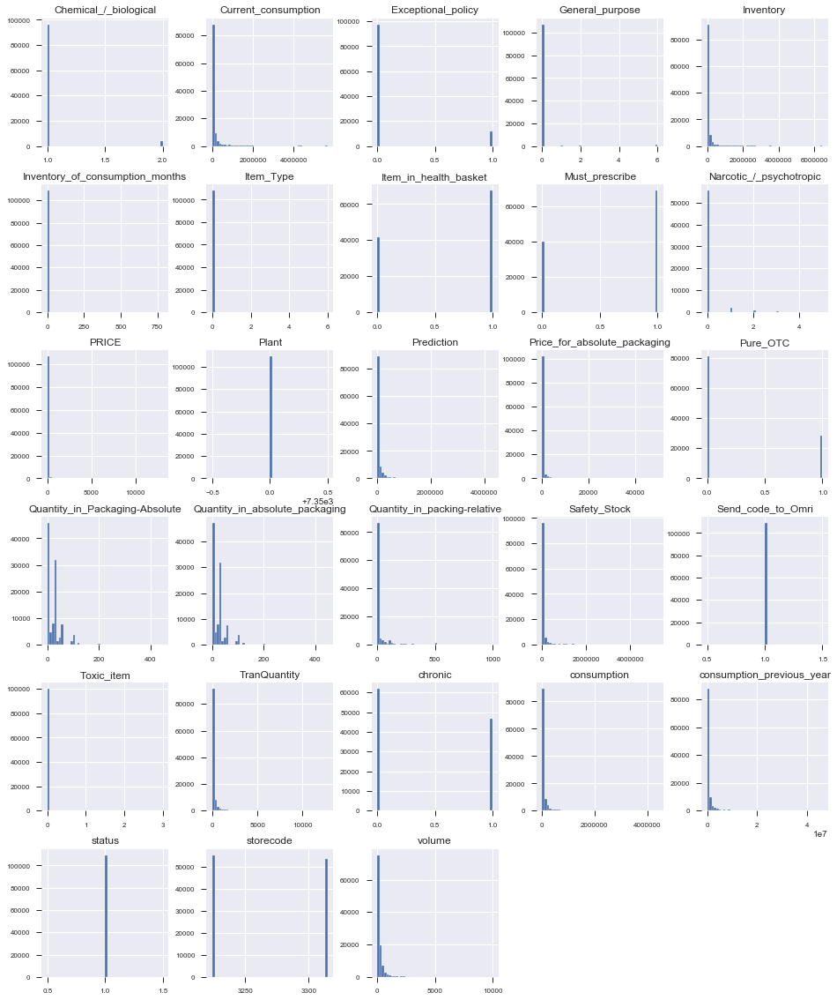

In [28]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

In [62]:
df_num_corr = df_num.corr()['TranQuantity'][:-1]  #-1 because the latest row is TranQuantity
golden_features_list = df_num_corr[abs(df_num_corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with TranQuantity:\n{}".format(len(golden_features_list), golden_features_list))

There is 7 strongly correlated values with TranQuantity:
TranQuantity                 1.000000
consumption_previous_year    0.891005
consumption                  0.871339
Current_consumption          0.869743
Prediction                   0.869112
Inventory                    0.796583
Safety_Stock                 0.796166
Name: TranQuantity, dtype: float64


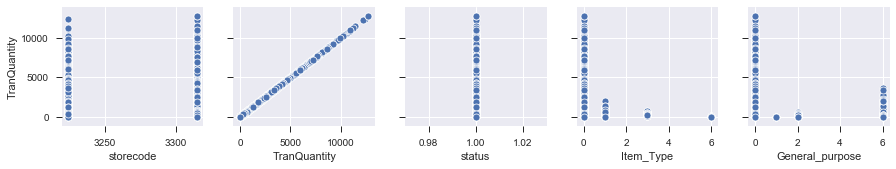

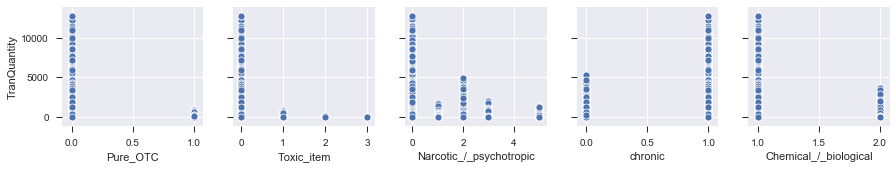

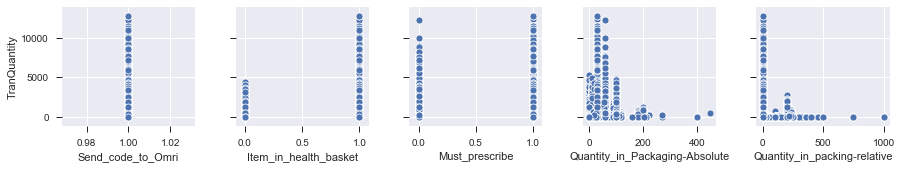

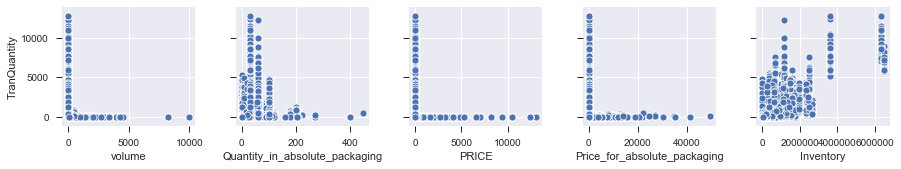

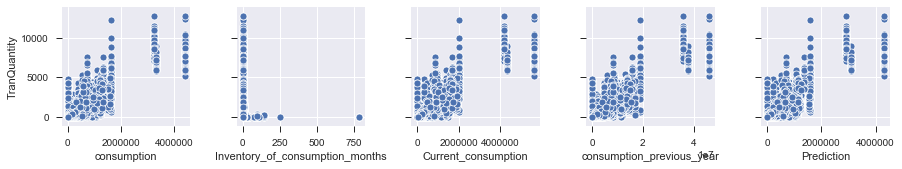

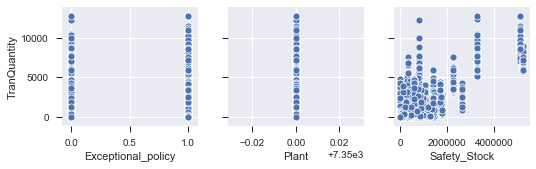

In [35]:
for i in range(0, len(df_num.columns), 5):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+5],
                y_vars=['TranQuantity'])

In [66]:
import operator

individual_features_df = []
for i in range(0, len(df_num.columns) - 1): # -1 because the last column is TranQuantity
    tmpDf = df_num[[df_num.columns[i], 'TranQuantity']]
    tmpDf = tmpDf[tmpDf[df_num.columns[i]] != 0]
    individual_features_df.append(tmpDf)

all_correlations = {feature.columns[0]: feature.corr()['TranQuantity'][0] for feature in individual_features_df}
all_correlations = sorted(all_correlations.items(), key=operator.itemgetter(1))
for (key, value) in all_correlations:
    print("{:15}: {:15}".format(key, value))

TypeError: '<' not supported between instances of 'str' and 'int'

sns.pairplot(df, hue="ABC", height=2.5);